In [49]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

plt.rcParams['figure.figsize'] = (20, 8)

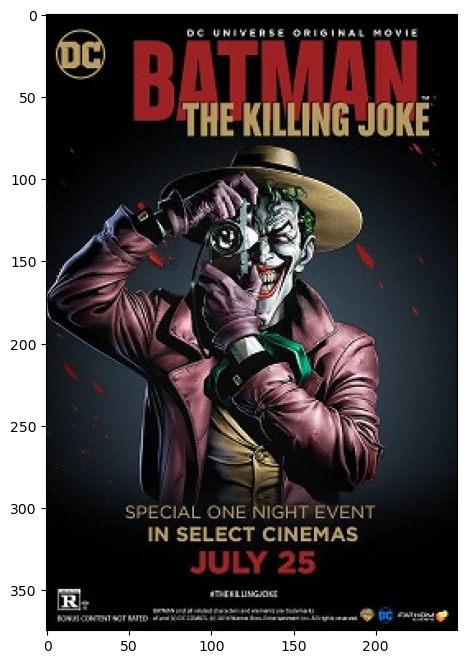

In [50]:
img = cv2.imread('/kaggle/input/images/tkj.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height, width = img.shape[:2]
plt.imshow(img)
plt.show()

Rotation about origin

In [51]:
angle = np.radians(20)
R = np.array([
    [np.cos(angle), np.sin(angle), 0],
    [-np.sin(angle), np.cos(angle), 0]])
dst1 = cv2.warpAffine(img,R,(width,height))

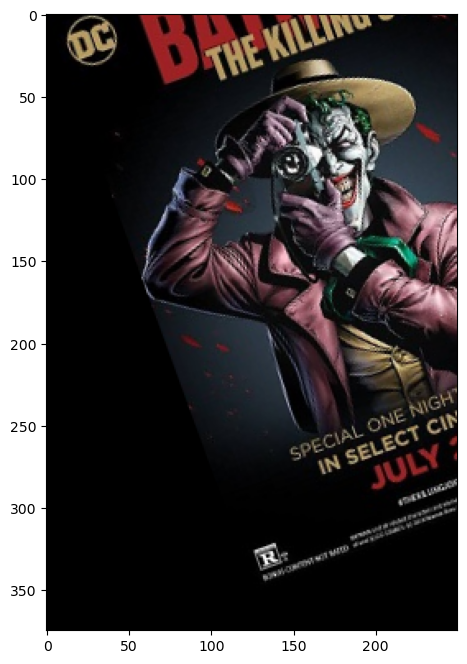

In [52]:
plt.imshow(dst1)

Rotation around centre

In [53]:
R = cv2.getRotationMatrix2D(center=(width//2, height//2), angle=20, scale=1)
dst2 = cv2.warpAffine(img,R,(width,height))


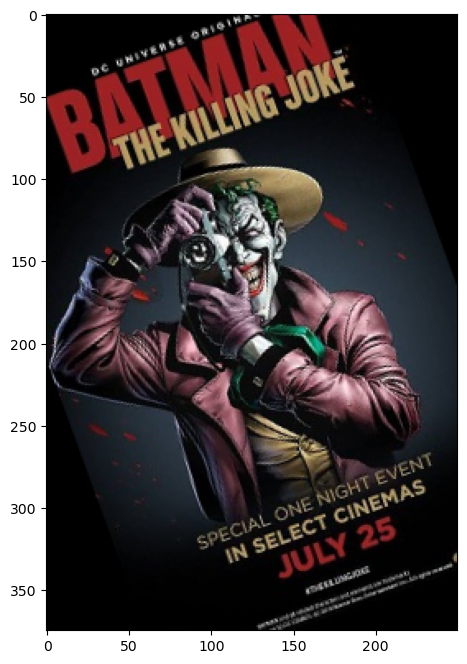

In [54]:
plt.imshow(dst2)

Scaling

In [55]:
scale = 2
S = np.array([
    [scale, 0, 0],
    [0, scale, 0]],dtype=np.float32)
dst3 = cv2.warpAffine(img,S,(width*scale,height*scale))

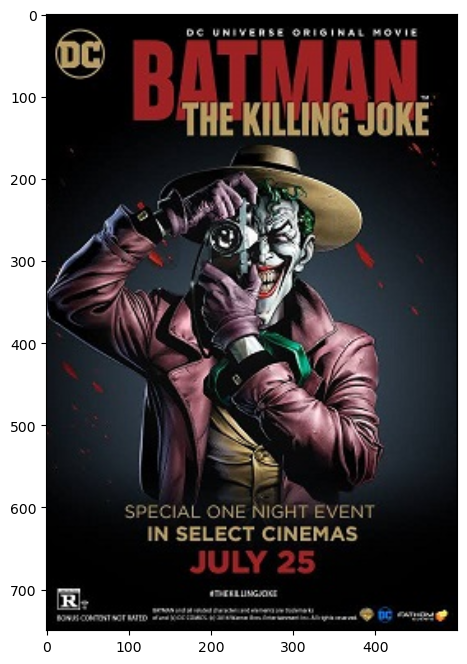

In [56]:
plt.imshow(dst3)

Shearing

In [57]:
sh_x = 0.5
sh_y = 0
Sh = np.array([
    [1, sh_x, 0],
    [sh_y, 1, 0]],dtype=np.float32)
dst4 = cv2.warpAffine(img,Sh,(width,height))

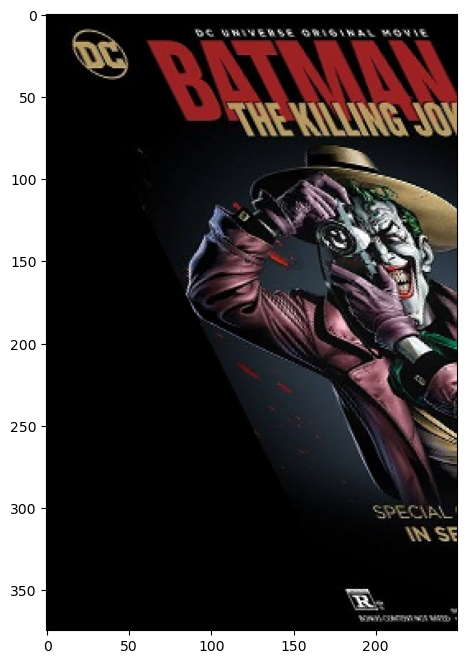

In [58]:
plt.imshow(dst4)

Translation

In [59]:
M = np.float32([[1, 0, 20], [0, 1, 0]])
dst5 = cv2.warpAffine(img, M, (width, height))

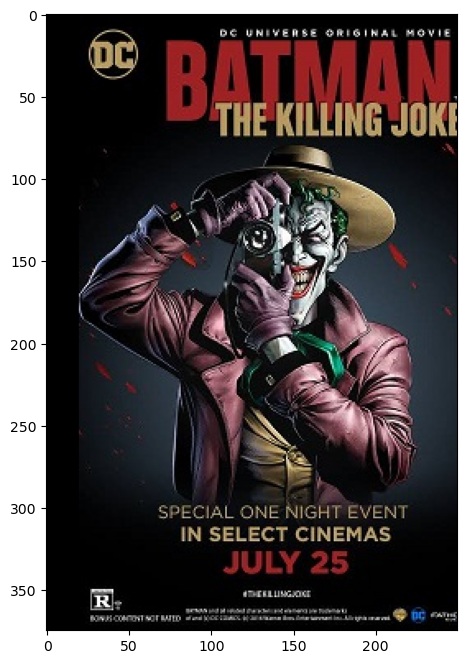

In [60]:
plt.imshow(dst5)

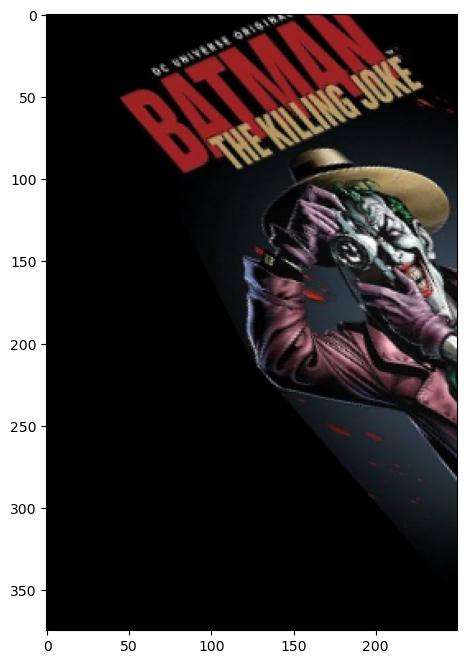

In [61]:
R = cv2.getRotationMatrix2D(center=(width//2, height//2), angle=20, scale=1)
dst2 = cv2.warpAffine(img,R,(width,height))

sh_x = 0.5
sh_y = 0
Sh = np.array([
    [1, sh_x, 0],
    [sh_y, 1, 0]],dtype=np.float32)
dst4 = cv2.warpAffine(dst2,Sh,(width,height))


M = np.float32([[1,0,20],[0,1,0]])
image = cv2.warpAffine(dst4,M,(width,height))

plt.imshow(image)

FEATURE MATCHING AND SIFT

In [62]:
def feature_matching(name1, name2):

    img1 = name1
    img2 = name2

    gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    sift = cv2.SIFT_create()
    keypoints_1 , descriptors_1 = sift.detectAndCompute(gray1,None)
    keypoints_2 , descriptors_2 = sift.detectAndCompute(gray2,None) 
    
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = True)
    matches = bf.match(descriptors_1, descriptors_2)
    
    matches = sorted(matches, key= lambda x: x.distance)
    img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:30], img2, flags=2)
    print(len(matches))
    
    plt.imshow(img3)
    plt.show()

218


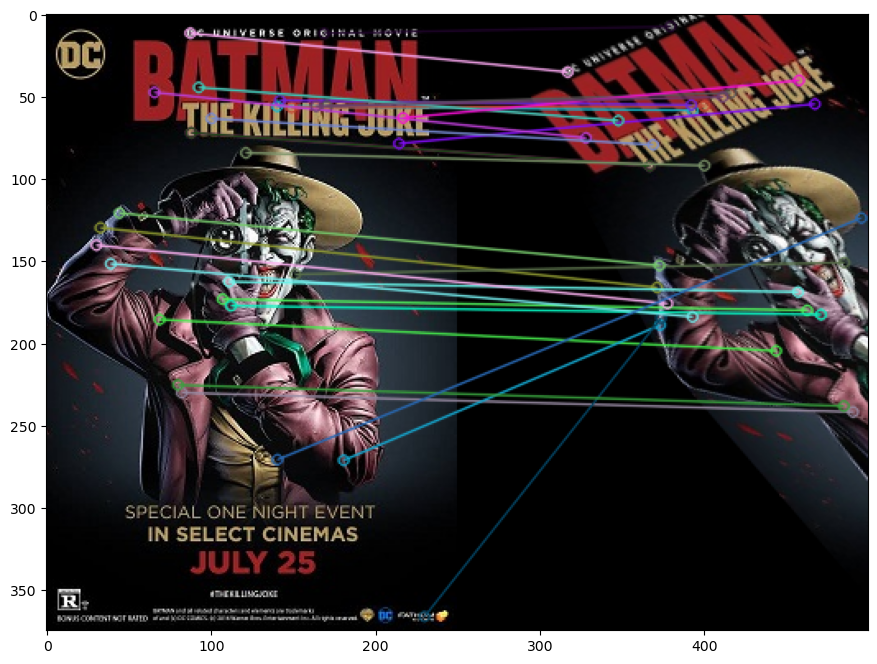

In [63]:
feature_matching(img,image)

350


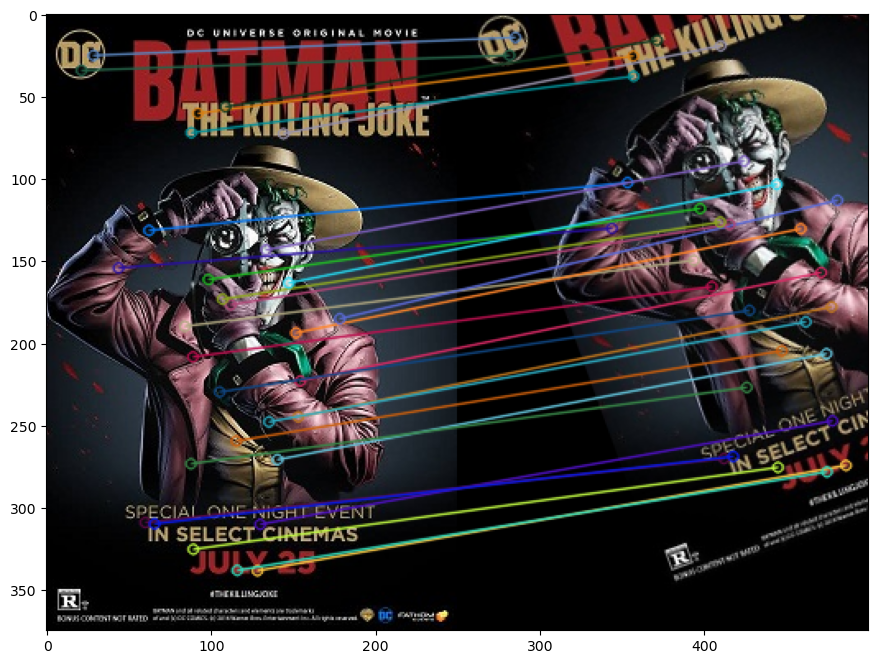

In [64]:
feature_matching(img,dst1)

485


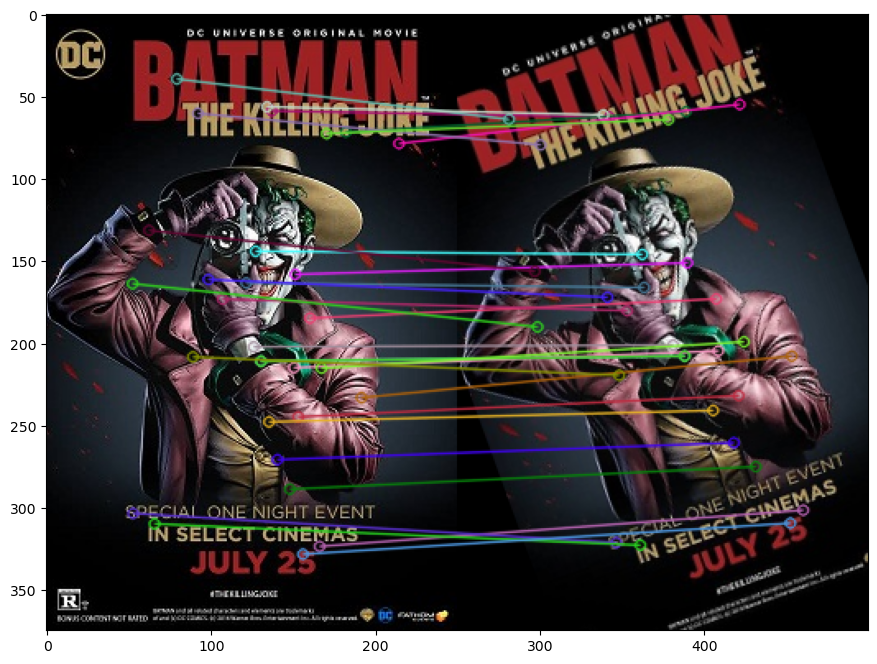

In [65]:
feature_matching(img,dst2)

577


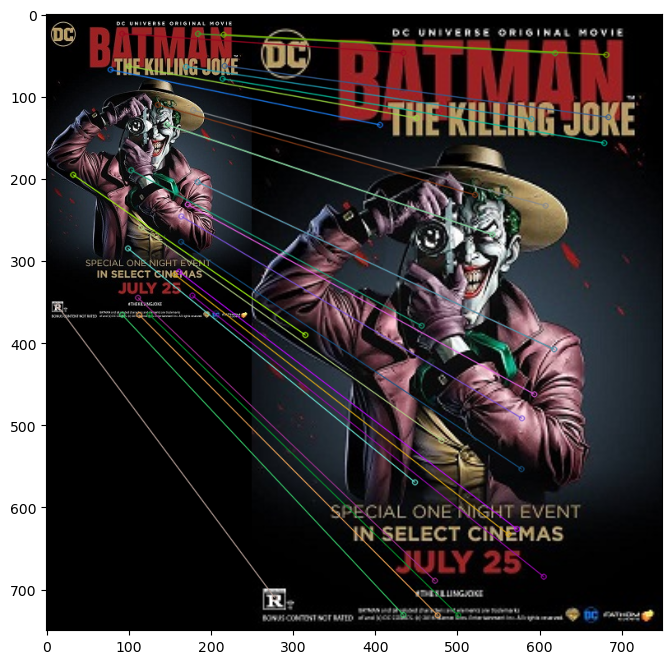

In [66]:
feature_matching(img,dst3)

232


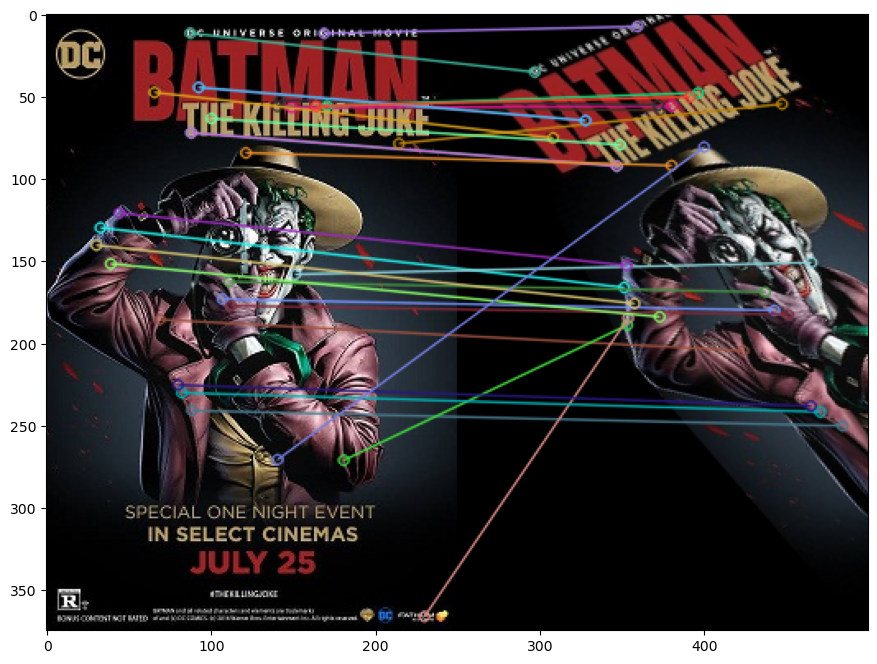

In [67]:
feature_matching(img,dst4)

Flip horizontally

In [68]:
image_flip = cv2.flip(image, 1)

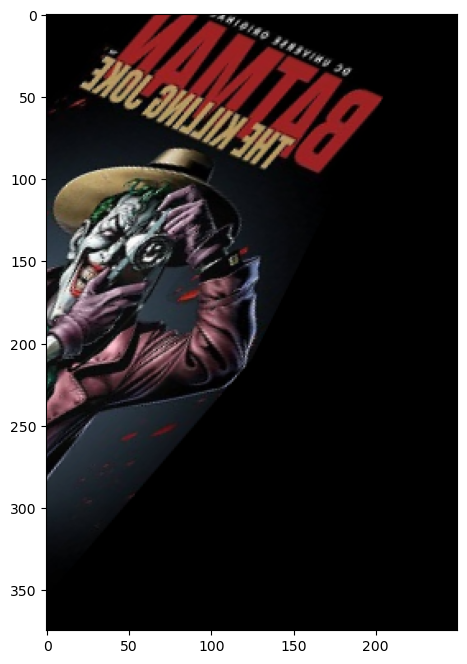

In [69]:
plt.imshow(image_flip)

Flip vertically

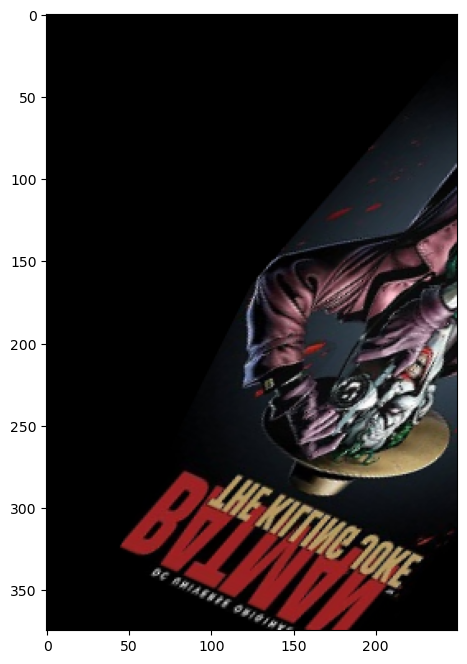

In [70]:
image_flip1 = cv2.flip(image,0)
plt.imshow(image_flip1)

169


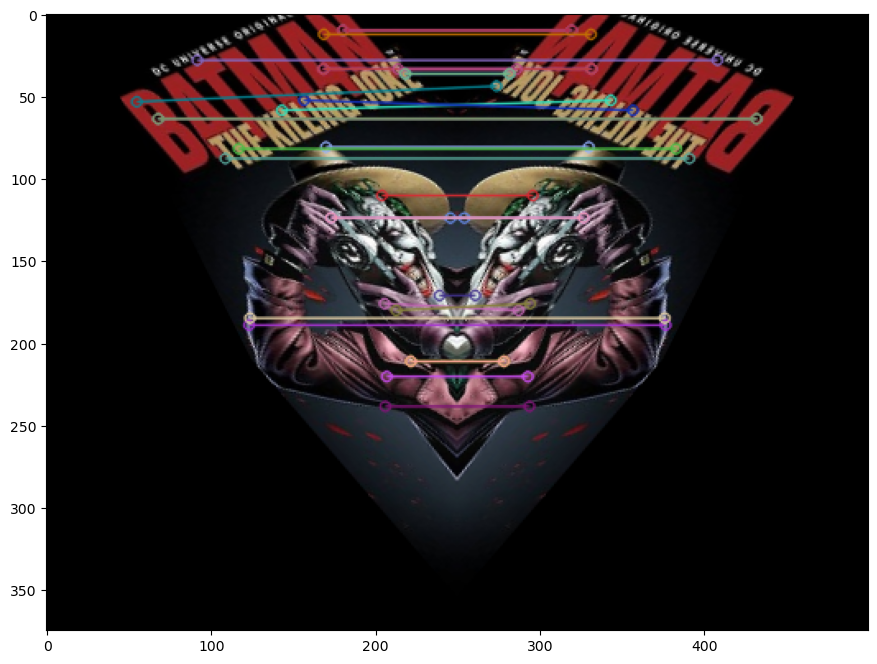

In [71]:
feature_matching(image,image_flip)

Projective/Perspective Transformations

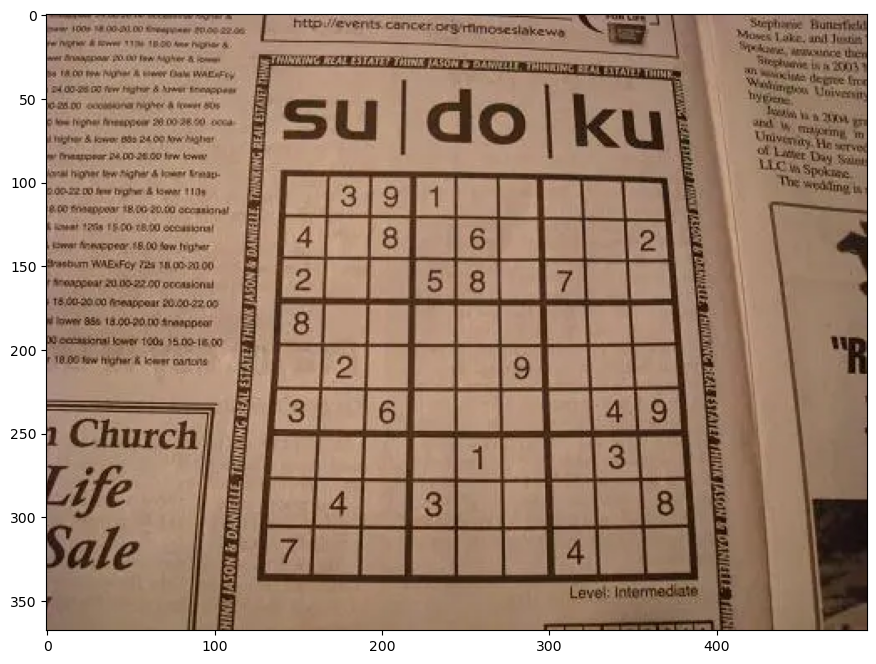

In [72]:
image = cv2.imread("/kaggle/input/images2/sudoku.webp")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.imshow(image)

In [73]:
image = cv2.circle(image, (140,90), radius=5, color=(0, 0, 255), thickness=-1)
image = cv2.circle(image, (370,100), radius=5, color=(0, 0, 255), thickness=-1)
image = cv2.circle(image, (130,335), radius=5, color=(0, 0, 255), thickness=-1)
image = cv2.circle(image, (390,335), radius=5, color=(0, 0, 255), thickness=-1)

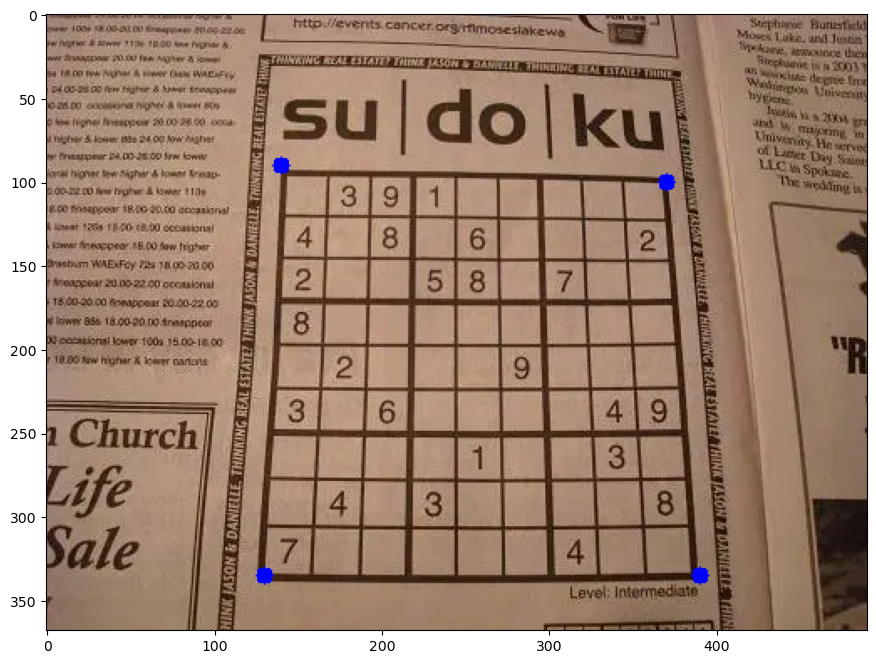

In [74]:
plt.imshow(image)

In [75]:
pts1 = np.float32([[140,90],[370,100],[130,335],[390,335]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
M = cv2.getPerspectiveTransform(pts1,pts2)
dst = cv2.warpPerspective(image,M,(300,300))

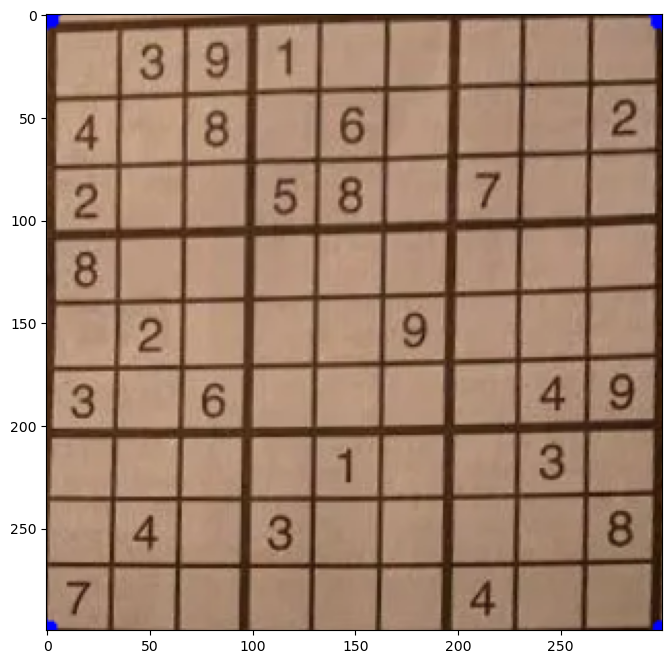

In [76]:
plt.imshow(dst)

Feature Matching and Sift

In [77]:
def read_show(filename1, filename2, display=False):
    img1 = cv2.imread(filename1)
    img2 = cv2.imread(filename2)

    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    if display:
        f, ax = plt.subplots(1,2)
        ax[0].imshow(img1)
        ax[1].imshow(img2)
        plt.show()
        return
    return img1, img2

def feature_matching(filename1, filename2):
    img1, img2 = read_show(filename1, filename2)
    gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    sift = cv2.SIFT_create()
    keypoints_1, descriptors_1 = sift.detectAndCompute(gray1, None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(gray2, None) 

    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = True)
    matches = bf.match(descriptors_1, descriptors_2)

    matches = sorted(matches, key=lambda x: x.distance)
    img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)

    plt.imshow(img3)
    plt.show()


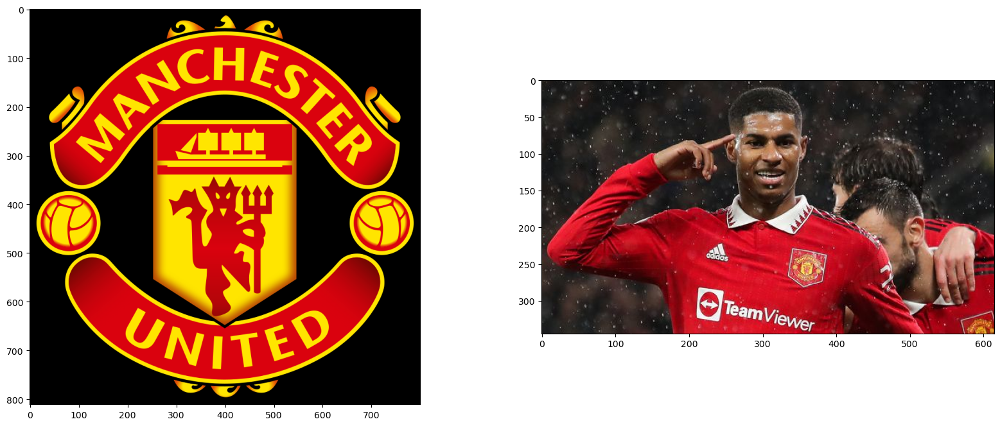

In [78]:
read_show("/kaggle/input/images3/man utd.png","/kaggle/input/images3/rashy2.jpg",True)

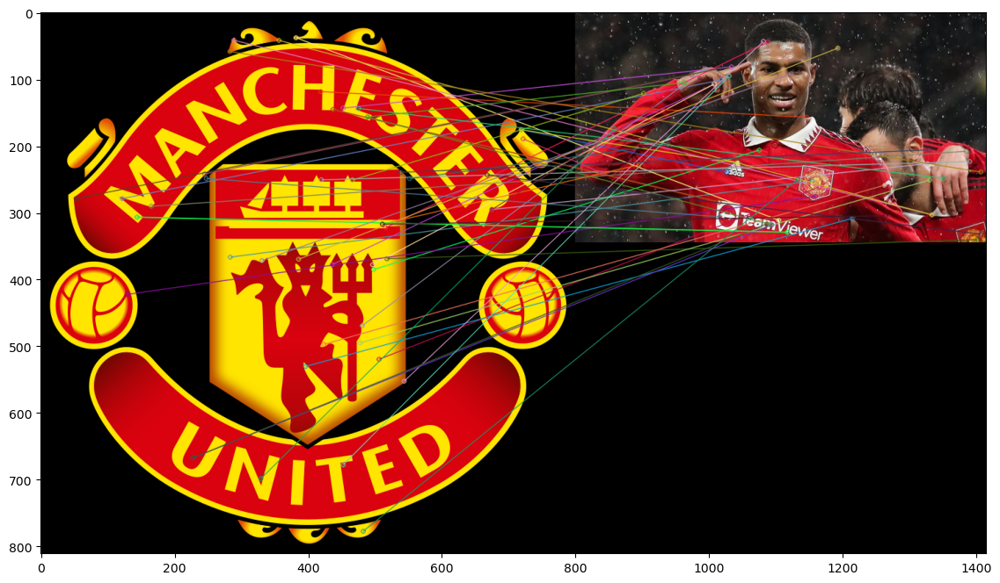

In [79]:
feature_matching("/kaggle/input/images3/man utd.png","/kaggle/input/images3/rashy2.jpg")